# Differential expression between WT and KD within celltypes

In [2]:
here::i_am("rna/differential/differential_expression.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(dplyr))

BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 21

# Multi core using future - built in to seurat
plan("multicore", workers = 16)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/code



In [3]:
args = list()
# RNA seurat 
args$metadata = file.path(io$basedir, 'results/rna/doublet_detection/sample_metadata_after_doublets.txt.gz')
args$sce = file.path(io$basedir, 'processed/rna/SingleCellExperiment.rds')
args$logFC_thr = 0.25
args$FDR_thr = 0.05

# outdir
args$outdir = file.path(io$basedir, 'results/rna/differential/')
dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

#### Load Data

In [31]:
# Load metadata
sample_metadata <- fread(args$metadata) %>%
  .[pass_rnaQC==TRUE & doublet_call==FALSE]

In [32]:
nrow(sample_metadata)

[1] 55111

In [33]:
# Load RNA expression data as SingleCellExperiment object
sce <- load_SingleCellExperiment(args$sce, cells=sample_metadata$cell, normalise = TRUE)

In [34]:
sce

class: SingleCellExperiment 
dim: 32285 55111 
metadata(0):
assays(2): counts logcounts
rownames(32285): Xkr4 Gm1992 ... AC234645.1 AC149090.1
rowData names(0):
colnames(55111): RBG43471#AAACAGCCAACACTTG-1
  RBG43471#AAACAGCCACATACTG-1 ... RBG43478#TTTGTTGGTTAGGTTG-1
  RBG43478#TTTGTTGGTTGGTTGA-1
colData names(11): barcode sample ... pass_rnaQC sizeFactor
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

#### Dimenionality reduction & Clustering

In [36]:
args$features = 2500
args$npcs = 20
args$n_neighbors = 30
args$min_dist = 0.3

In [37]:
# Feature selection
decomp <- modelGeneVar(sce)
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% head(n=args$features) %>% rownames

# Subset SingleCellExperiment
sce_filt <- sce[hvgs,]

# Run PCA
sce_filt <- runPCA(sce_filt, ncomponents = args$npcs, ntop=args$features)

In [38]:
# Run UMAP
sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = args$n_neighbors, min_dist = args$min_dist)

In [114]:
# Fetch UMAP coordinates
umap.dt <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)] %>%
  setnames(c("UMAP1","UMAP2","cell"))

In [40]:
table(sample_metadata$day, sample_metadata$sample, sample_metadata$genotype)

, ,  = Eomes_KO

      
       RBG43471 RBG43472 RBG43473 RBG43474 RBG43475 RBG43476 RBG43477 RBG43478
  D2.5        0        0        0        0        0        0        0        0
  D3          0        0    12511     7446        0        0        0        0
  D4.5        0        0        0        0        0        0     8549        0

, ,  = WT

      
       RBG43471 RBG43472 RBG43473 RBG43474 RBG43475 RBG43476 RBG43477 RBG43478
  D2.5     6274     5686        0        0        0        0        0        0
  D3          0        0        0        0     5171     3931        0        0
  D4.5        0        0        0        0        0        0        0     5543


In [41]:
colnames(sample_metadata)

[1] "cell"                      "barcode"                  
 [3] "sample"                    "nFeature_RNA"             
 [5] "nCount_RNA"                "mitochondrial_percent_RNA"
 [7] "ribosomal_percent_RNA"     "alias"                    
 [9] "day"                       "genotype"                 
[11] "pass_rnaQC"                "doublet_score"            
[13] "doublet_call"

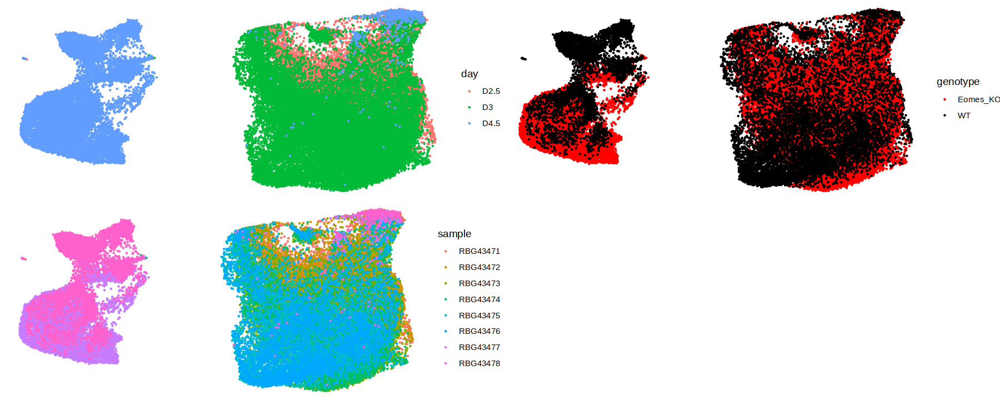

In [91]:
# Plot umap
to.plot = merge(umap.dt, sample_metadata, by='cell')

p1 = ggplot(to.plot, aes(UMAP1, UMAP2, col=day)) + 
    geom_point(size=0.2) + 
    theme_void()
p2 = ggplot(to.plot, aes(UMAP1, UMAP2, col=genotype)) + 
    geom_point(size=0.2) + 
    scale_color_manual(values=c('Eomes_KO' = 'red', 'WT' = 'black')) + 
    theme_void()
p3 = ggplot(to.plot, aes(UMAP1, UMAP2, col=sample)) + 
    geom_point(size=0.2) + 
    theme_void()

options(repr.plot.width=15, repr.plot.height=6)
ggarrange(p1, p2, p3)

In [47]:
# Add dimensionality reduction to original sce
sce@int_colData = sce_filt@int_colData

In [50]:
# Convert to Seurat
seurat = as.Seurat(sce)

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from PC to PC_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to PC_”


In [51]:
seurat

An object of class Seurat 
32285 features across 55111 samples within 1 assay 
Active assay: RNA (32285 features, 0 variable features)
 2 dimensional reductions calculated: PCA, UMAP

In [57]:
# Clustering
seurat <- FindNeighbors(seurat, reduction='PCA')
seurat <- FindClusters(seurat, resolution = 0.8)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 55111
Number of edges: 1603337

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8596
Number of communities: 19
Elapsed time: 19 seconds


Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


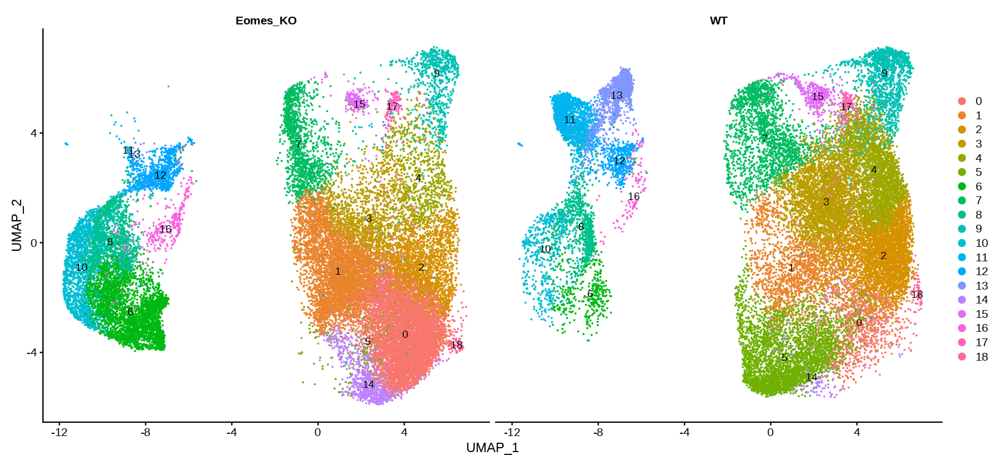

In [58]:
# Plot UMAP
options(repr.plot.width=15, repr.plot.height=7)
DimPlot(seurat, reduction = "UMAP",  label = TRUE, split.by = 'genotype')

In [81]:
# Marker detection
markers <- FindAllMarkers(seurat, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18



In [82]:
cluster_levels = c(18, 0, 1, 2, 3, 4, 14, 5,
                   9, 17, 
                   7, 15,
                   6, 8, 10, 16,
                   11, 12, 13
                  )
seurat@meta.data$seurat_clusters2 = factor(seurat@meta.data$seurat_clusters, levels = cluster_levels)

In [83]:
head(markers)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Ppp4r4,0,0.8093632,0.967,0.534,0,0,Ppp4r4
Kcnh8,0,0.7674994,0.763,0.320,0,0,Kcnh8
T,0,0.6750236,0.894,0.448,0,0,T
Klhl32,0,0.6613173,0.905,0.498,0,0,Klhl32
Xkr4,0,0.6261558,0.932,0.595,0,0,Xkr4
Nrcam,0,0.6152967,0.958,0.602,0,0,Nrcam


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


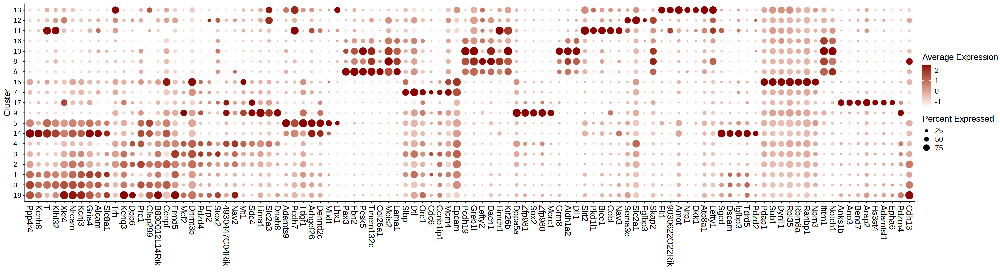

In [84]:
# Marker gene plot
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 7, order_by = avg_log2FC) %>% .$gene

options(repr.plot.width=25, repr.plot.height=7)
DotPlot(seurat, features = unique(features), group.by = 'seurat_clusters2') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

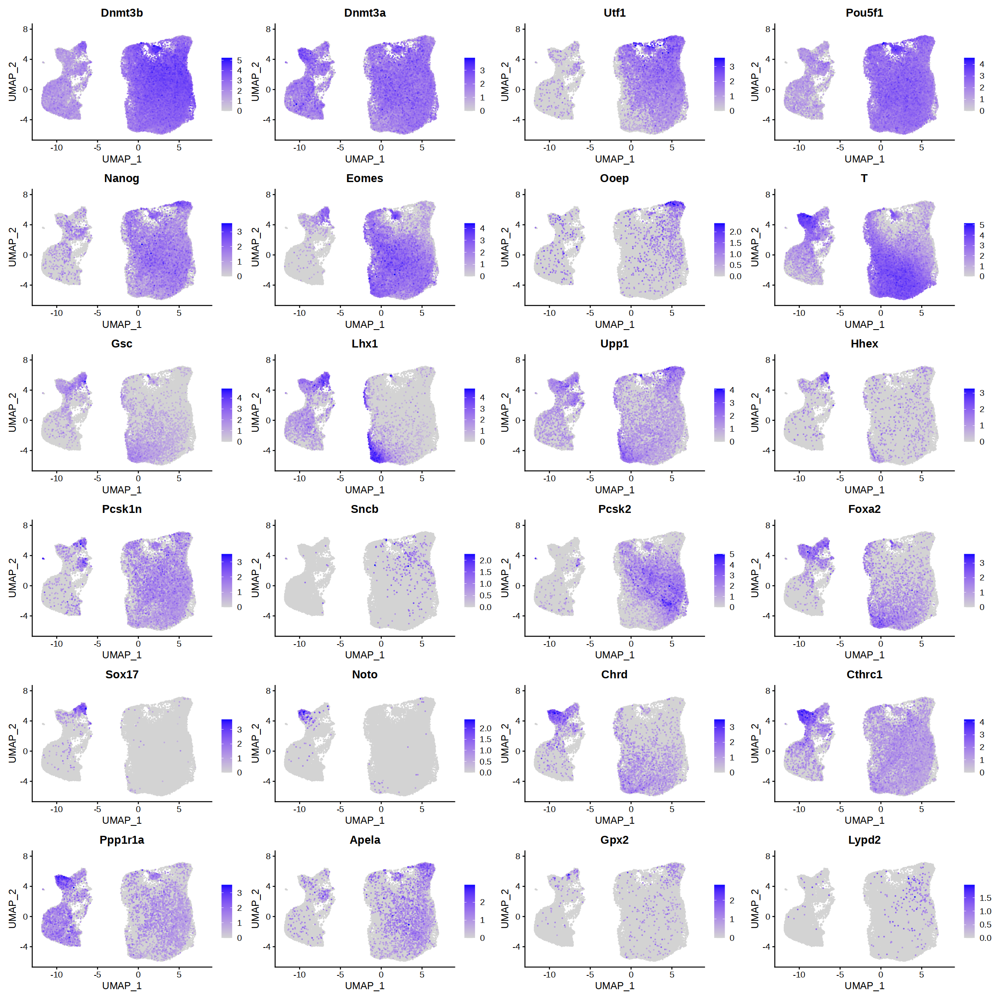

In [93]:
options(repr.plot.width=20, repr.plot.height=20)
features = c('Dnmt3b', 'Dnmt3a', 'Utf1', 'Pou5f1',  # Epiblast
             'Nanog', 'Eomes', 'Ooep', 'T',  # PS
             'Gsc', 'Lhx1', 'Upp1', 'Hhex',  # APS
             'Pcsk1n', 'Sncb', 'Pcsk2', # Rostral NE
             'Foxa2', 'Sox17', # Def. Endoderm
             'Noto', 'Chrd', 'Cthrc1', 'Ppp1r1a',  # Notochord
             'Apela', 'Gpx2', 'Lypd2'# Gut
            )
FeaturePlot(seurat, features = features, order=TRUE)

In [116]:
clusters2celltypes = c(
    '18' = 'Unknown_Cdh13+', 
    '0' = 'PS_T+', 
    '1' = 'PS_T+',   
    '2' = 'Epiblast_Dnmt3b+', 
    '3' = 'Epiblast_Dnmt3b+', 
    '4' = 'Epiblast_Dnmt3b+', 
    '14' = 'APS_Mixl1-', 
    '5' = 'APS_Mixl1+',
    '9' = 'Ectoderm_Sox2+', # Or PGC - Dppa3+ but neg for others 
    '17' = 'Unknown_1', 
    '7' = 'PS_Epcam+', 
    '15' = 'unknown_Pdap1+', 
    '6' = 'Paraxial_Mesoderm_Col26a1+', 
    '8' = 'Somitic_Mesoderm_Dll1+', 
    '10' = 'Somitic_Mesoderm_Dll1+', 
    '16' = 'Pseudo_Somitic_Mesoderm', 
    '11' = 'Notochord_Noto+',
    '12' = 'Definitive_Endoderm?',
    '13' = 'Gut_Progenitor_Trh+') # both ExE and Def. Endoderm markers

In [129]:
clusters2celltypes = c(
    '2' = 'Epiblast_Dnmt3b+', 
    '3' = 'Epiblast_Dnmt3b+', 
    '4' = 'Epiblast_Dnmt3b+', 
    '7' = 'PS_Epcam+', 
    '0' = 'PS_T+', 
    '1' = 'PS_T+',   
    '14' = 'APS_Mixl1-', 
    '5' = 'APS_Mixl1+',
    '9' = 'Ectoderm_Sox2+', # Or PGC - Dppa3+ but neg for others 
    '18' = 'Unknown_Cdh13+', 
    '17' = 'Unknown_1', 
    '15' = 'unknown_Pdap1+', 
    '6' = 'Paraxial_Mesoderm_Col26a1+', 
    '8' = 'Somitic_Mesoderm_Dll1+', 
    '10' = 'Somitic_Mesoderm_Dll1+', 
    '16' = 'Pseudo_Somitic_Mesoderm', 
    '11' = 'Notochord_Noto+',
    '12' = 'Definitive_Endoderm?',
    '13' = 'Gut_Progenitor_Trh+') # both ExE and Def. Endoderm markers

In [117]:
seurat@meta.data$celltypes_v1 = clusters2celltypes[match(as.character(seurat@meta.data$seurat_clusters), names(clusters2celltypes))]

In [118]:
palette = c(ArchR::ArchRPalettes$stallion, ArchR::ArchRPalettes$stallion2)[1:length(unique(clusters2celltypes))]
names(palette) = unique(clusters2celltypes)

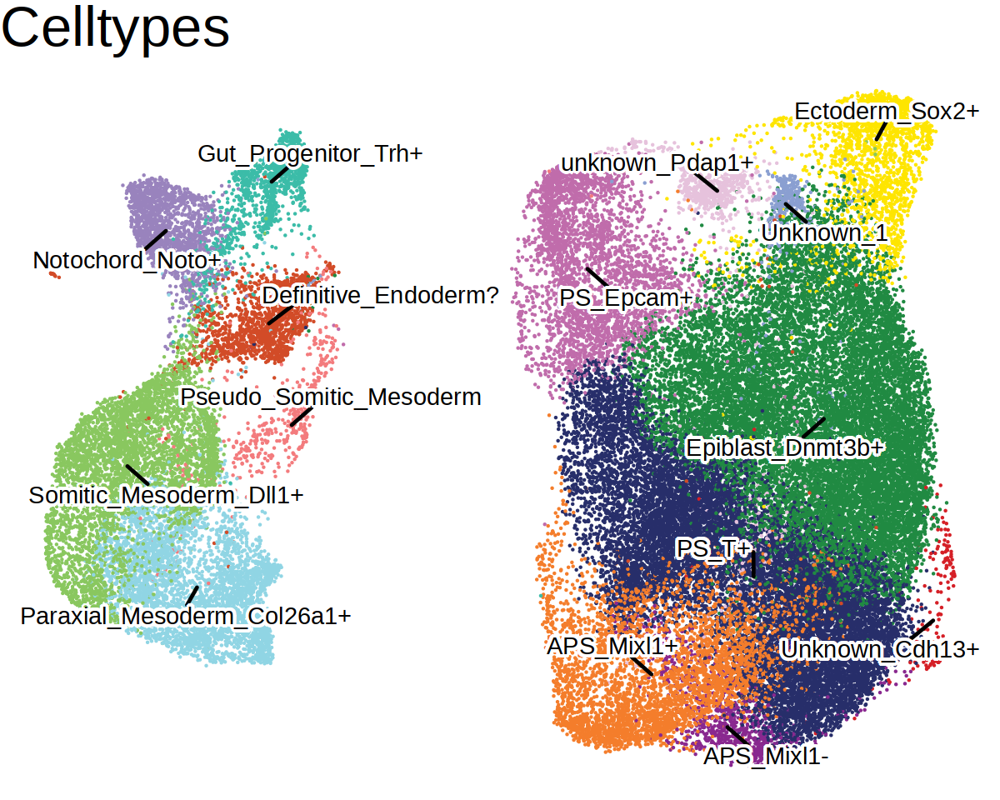

In [119]:
to.plot = cbind(umap.dt, data.table(celltypes_v1 = seurat@meta.data$celltypes_v1))
labels = to.plot[,`:=`(mean_UMAP1 = median(UMAP1),
                       mean_UMAP2 = median(UMAP2)), 
                       by=celltypes_v1] %>% unique(by='celltypes_v1')
p = ggplot(to.plot, aes(UMAP1, UMAP2, col=celltypes_v1, label=celltypes_v1)) + 
    geom_point(size=0.2) + 
    ggrepel::geom_text_repel(data=labels, aes(mean_UMAP1, mean_UMAP2), 
                             col='black', 
                             size=6,  
                             bg.color = "white", 
                             bg.r=0.2,
                             box.padding=1,
                             max.overlaps=Inf,
                             #   segment.curvature = -1,
    segment.size = 1) +
    scale_color_manual(values=palette, name='') +
    guides(colour = guide_legend(override.aes = list(size=4))) + 
    ggtitle('Celltypes') +
    theme_void() +
     theme(text=element_text(size=15), 
          plot.title=element_text(size=40), 
          legend.position='none')#,
    #      legend.box="vertical", legend.margin=margin())

options(repr.plot.width=10, repr.plot.height=8)
p 

In [126]:
# Save Seurat object
saveRDS(seurat, file.path(args$outdir, 'seurat_full.rds'))

# Save markers
fwrite(markers, file.path(args$outdir, 'cluster_markers.txt.gz'))

#### Differential testing

In [127]:
# Remove D2.5 cells, as they are taken before Dtag addition
seurat = seurat[,sample_metadata[day!='D2.5', cell]]
seurat

An object of class Seurat 
32285 features across 43151 samples within 1 assay 
Active assay: RNA (32285 features, 0 variable features)
 2 dimensional reductions calculated: PCA, UMAP

In [128]:
Idents(seurat) = seurat@meta.data$genotype

In [135]:
meta = as.data.table(seurat@meta.data, keep.rownames=T) %>% 
    setnames('rn', 'cell')

In [137]:
find_DEGs = function(celltype_test, logFC_thr = args$logFC_thr, FDR_thr = args$FDR_thr, test = 'wilcox'){
    message(celltype_test)
    tmp = seurat[, meta[celltypes_v1==celltype_test]$cell]
    markers_tmp = FindMarkers(tmp, ident.1 = "Eomes_KO", ident.2 = "WT",
      logfc.threshold = logFC_thr, test.use = test)
    tmp = as.data.table(markers_tmp, keep.rownames=T) %>%
        setnames('rn', 'gene') %>% 
        .[,sig:=ifelse(abs(avg_log2FC)>logFC_thr & p_val_adj <= FDR_thr, TRUE, FALSE)] %>% 
        .[,celltype:=celltype_test]
    return(tmp)
}  

volcano_plot = function(dt, ntop=5, logFC_thr = args$logFC_thr, FDR_thr = args$FDR_thr, title=NULL){
    tmp = dt[,sign:=ifelse(p_val_adj < FDR_thr & abs(avg_log2FC) > logFC_thr, ifelse(avg_log2FC>0, 'pos', 'neg'), 'nonsig')] %>%
        .[order(-abs(avg_log2FC))]
    labels = tmp[, head(.SD, ntop),  by=sign][sign!='nonsig']
    
    p = ggplot(tmp, aes(avg_log2FC, -log10(p_val_adj), col=sign)) + 
        geom_point() +  
        scale_colour_manual(values=c('pos' = 'red', 'neg' = 'blue', 'nonsig' = 'black')) + 
        geom_vline(xintercept=c(-logFC_thr, logFC_thr),  linetype = "longdash") +
        geom_vline(xintercept=0, color='orange', linetype = "longdash") +
        geom_hline(yintercept=-log10(FDR_thr),  linetype = "longdash") + 
        ggrepel::geom_text_repel(data=labels, aes(label=gene), 
                                 color='black',
                                 size=5,
                                 box.padding = 0.5, 
                                 max.overlaps = Inf,
                                 bg.color='white', 
                                 bg.r = 0.1) + 
        xlim(c(-max(abs(tmp$avg_log2FC)), max(abs(tmp$avg_log2FC)))) + 
        ggtitle(title) + 
        theme_bw() + 
        theme(text = element_text(size=15, color='black'),
             axis.text = element_text(size=15, color='black'),
             legend.position = 'none')

    
    return(p)
}

In [143]:
keep = unique(clusters2celltypes)

In [138]:
DEGs = mclapply(keep, find_DEGs, mc.cores=16) %>% rbindlist()

In [139]:
head(DEGs)

gene,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,sig,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>
Adamts9,1.851097e-133,-0.4246622,0.143,0.435,5.976266e-129,TRUE,Epiblast_Dnmt3b+
Sdhd,1.619132e-81,-0.2878153,0.284,0.598,5.227368e-77,TRUE,Epiblast_Dnmt3b+
Fgf8,1.115805e-79,-0.3640413,0.522,0.771,3.602376e-75,TRUE,Epiblast_Dnmt3b+
Fat3,4.124949e-73,-0.3725373,0.283,0.525,1.331740e-68,TRUE,Epiblast_Dnmt3b+
Nodal,3.446057e-71,-0.2820007,0.322,0.619,1.112560e-66,TRUE,Epiblast_Dnmt3b+
Zfp462,5.734701e-66,0.2775208,0.791,0.726,1.851448e-61,TRUE,Epiblast_Dnmt3b+


In [12]:
fwrite(DEGs, sprintf('%s/DEGs_seurat.txt.gz', args$outdir))

In [144]:
plots = mclapply(keep, function(x){
    tmp = DEGs[celltype==x]
    p = volcano_plot(tmp, ntop=10, title=x)
    return(p)
})

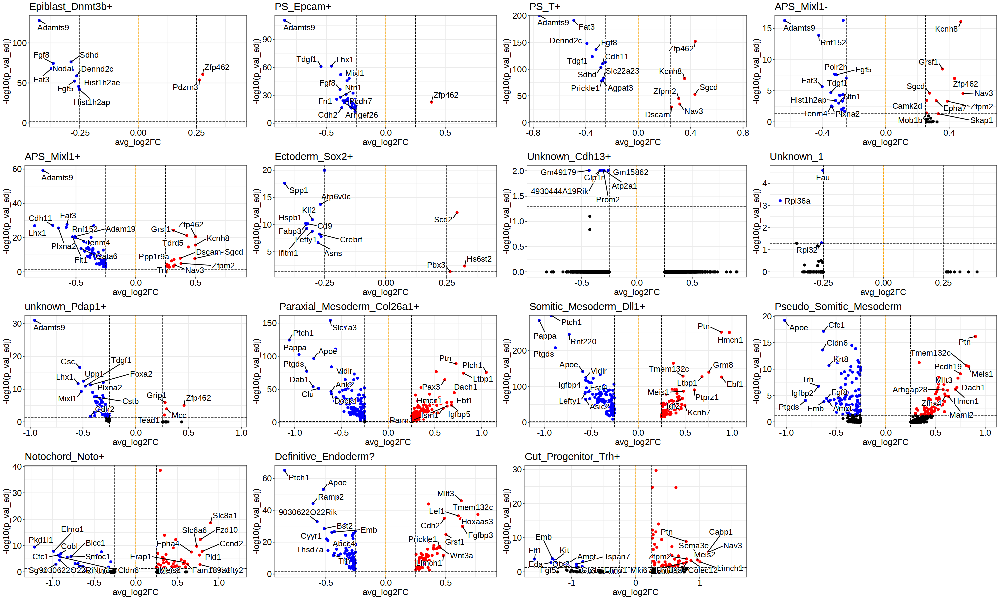

In [145]:
options(repr.plot.width=25, repr.plot.height=15)
ggarrange(plotlist=plots)

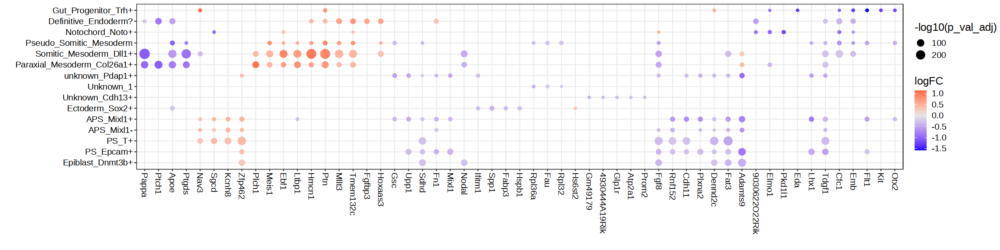

In [158]:
features = unique(DEGs[p_val_adj<0.05 & abs(avg_log2FC) > 0.25] %>% .[order(-abs(avg_log2FC)), ]) %>% .[,head(.SD, 5), by=celltype] %>% .$gene

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'avg_log2FC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'avg_log2FC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & p_val_adj < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = keep)]

options(repr.plot.width=20, repr.plot.height=5)
ggplot(to.plot, aes(gene, celltype, size=-log10(p_val_adj), col=avg_log2FC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

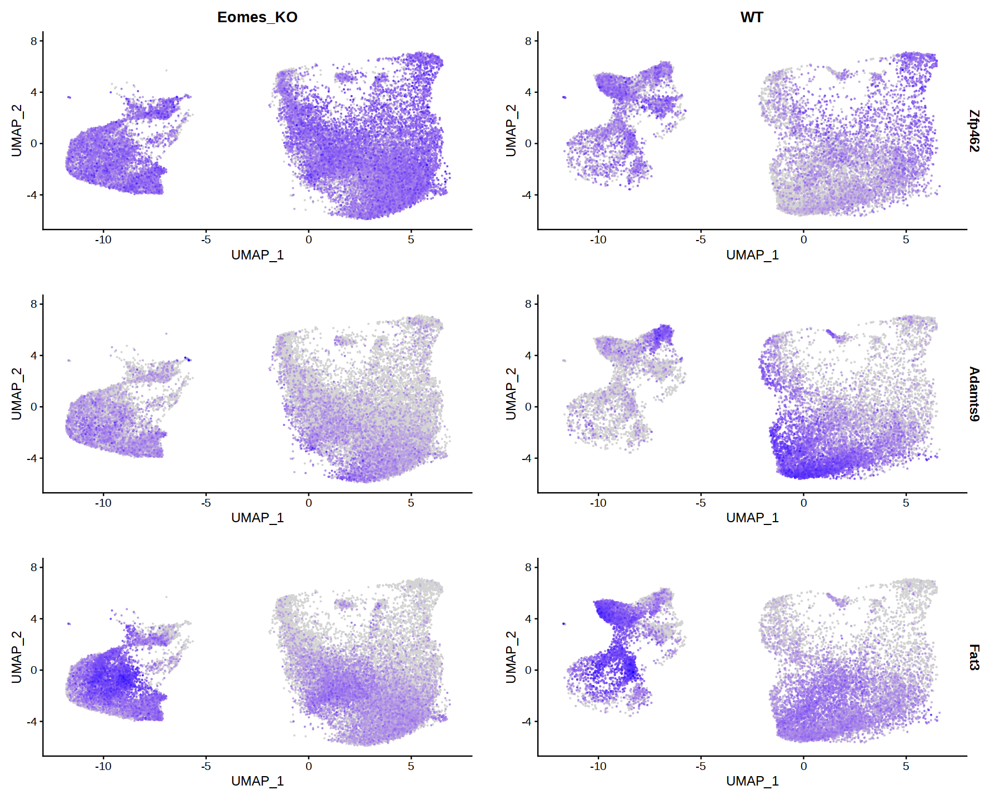

In [307]:
options(repr.plot.width=15, repr.plot.height=12)
FeaturePlot(seurat, features = c('Zfp462', 'Adamts9','Fat3'), split.by='genotype', order=TRUE)

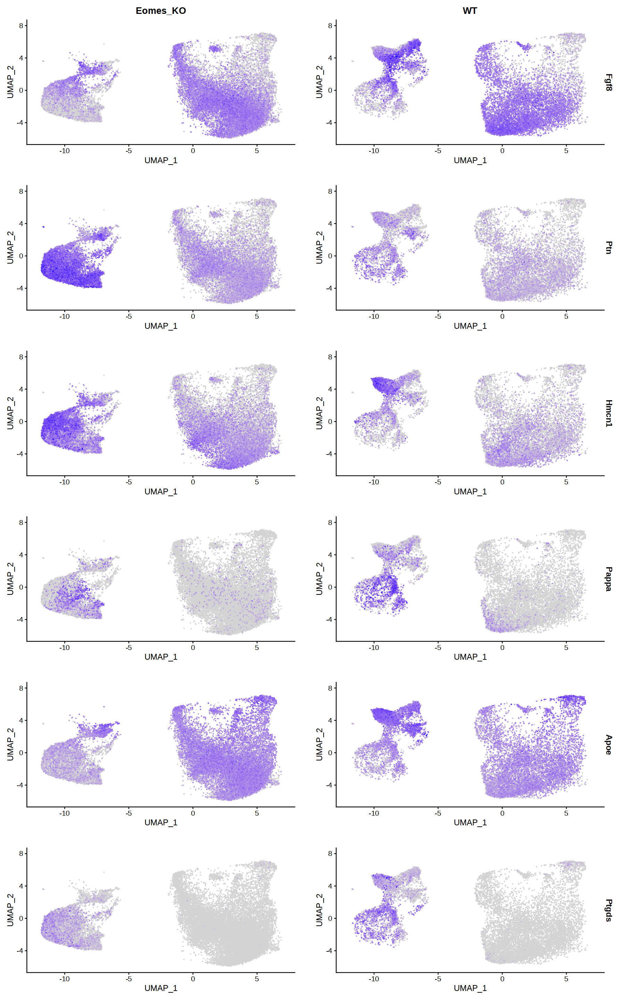

In [308]:
options(repr.plot.width=15, repr.plot.height=24)
FeaturePlot(seurat, features = c('Fgf8', 'Ptn','Hmcn1', 'Pappa', 'Apoe', 'Ptgds'), split.by='genotype', order=TRUE)

# EdgeR

In [162]:
volcano_plot = function(dt, ntop=5, logFC_thr = args$logFC_thr, FDR_thr = args$FDR_thr, title=NULL){
    tmp = dt[,sign:=ifelse(padj_fdr < FDR_thr & abs(logFC) > logFC_thr, ifelse(logFC>0, 'pos', 'neg'), 'nonsig')] %>%
        .[order(-abs(logFC))]
    labels = tmp[, head(.SD, ntop),  by=sign][sign!='nonsig']
    
    p = ggplot(tmp, aes(logFC, -log10(padj_fdr), col=sign)) + 
        geom_point() + 
        scale_colour_manual(values=c('pos' = 'red', 'neg' = 'blue', 'nonsig' = 'black')) + 
        geom_vline(xintercept=c(-logFC_thr, logFC_thr),  linetype = "longdash") +
        geom_vline(xintercept=0, color='orange', linetype = "longdash") +
        geom_hline(yintercept=-log10(FDR_thr),  linetype = "longdash") + 
        ggrepel::geom_text_repel(data=labels, aes(label=gene), 
                                 color='black',
                                 size=5,
                                 box.padding = 0.5, 
                                 max.overlaps = Inf,
                                 bg.color='white', 
                                 bg.r = 0.1) + 
        xlim(c(-max(abs(tmp$logFC)), max(abs(tmp$logFC)))) + 
        ggtitle(title) + 
        theme_bw() + 
        theme(text = element_text(size=15, color='black'),
             axis.text = element_text(size=15, color='black'),
             legend.position = 'none')

    
    return(p)
}

In [163]:
suppressPackageStartupMessages(library(edgeR))

In [178]:
#cell_metadata.dt = meta[day != 'D3']
cell_metadata.dt = meta[,group:=paste0(celltypes_v1, '.', genotype)]

args$min_cells = 40
args$fraction_cells_per_replicate = 0.4
args$nrep = 5
args$min_CDR = 0.35

# Define groups
args$groupA = 'WT'
args$groupB = 'Eomes_KO'
opts$groups <- c(args$groupA,args$groupB)

In [177]:
table(cell_metadata.dt$group)


                APS_Mixl1-.Eomes_KO                       APS_Mixl1-.WT 
                                894                                 145 
                APS_Mixl1+.Eomes_KO                       APS_Mixl1+.WT 
                                239                                3763 
      Definitive_Endoderm?.Eomes_KO             Definitive_Endoderm?.WT 
                               1023                                 468 
            Ectoderm_Sox2+.Eomes_KO                   Ectoderm_Sox2+.WT 
                                739                                 520 
          Epiblast_Dnmt3b+.Eomes_KO                 Epiblast_Dnmt3b+.WT 
                               4545                                1822 
       Gut_Progenitor_Trh+.Eomes_KO              Gut_Progenitor_Trh+.WT 
                                 21                                1216 
           Notochord_Noto+.Eomes_KO                  Notochord_Noto+.WT 
                                 47               

In [184]:
##################################
## Create pseudobulk replicates ##
##################################

cell2replicate.dt <- lapply(unique(cell_metadata.dt$group), function(i){
    tmp <- cell_metadata.dt[group==i]
  if ((args$fraction_cells_per_replicate*nrow(tmp))<=args$min_cells) {
      tmp = data.table(cell=NA, group=NA, replicate=NA)
  } else {
    ncells_per_replicate <- round(args$fraction_cells_per_replicate*nrow(tmp))
  
  seq(1,args$nrep) %>% map(function(j) {
    tmp[sample.int(nrow(tmp),ncells_per_replicate)] %>% 
      .[,replicate:=sprintf("%s_rep%s",i,j)] %>%
      .[,c("cell","group","replicate")] %>% 
      return
  })} %>% rbindlist %>% return
}) %>% rbindlist

stats.dt <- cell2replicate.dt[,.(ncells=.N),c("group","replicate")]
print(stats.dt)

                             group                          replicate ncells
  1:                PS_T+.Eomes_KO                PS_T+.Eomes_KO_rep1   4654
  2:                PS_T+.Eomes_KO                PS_T+.Eomes_KO_rep2   4654
  3:                PS_T+.Eomes_KO                PS_T+.Eomes_KO_rep3   4654
  4:                PS_T+.Eomes_KO                PS_T+.Eomes_KO_rep4   4654
  5:                PS_T+.Eomes_KO                PS_T+.Eomes_KO_rep5   4654
 ---                                                                        
127: Paraxial_Mesoderm_Col26a1+.WT Paraxial_Mesoderm_Col26a1+.WT_rep1    155
128: Paraxial_Mesoderm_Col26a1+.WT Paraxial_Mesoderm_Col26a1+.WT_rep2    155
129: Paraxial_Mesoderm_Col26a1+.WT Paraxial_Mesoderm_Col26a1+.WT_rep3    155
130: Paraxial_Mesoderm_Col26a1+.WT Paraxial_Mesoderm_Col26a1+.WT_rep4    155
131: Paraxial_Mesoderm_Col26a1+.WT Paraxial_Mesoderm_Col26a1+.WT_rep5    155


In [197]:
cell2replicate.dt = cell2replicate.dt[!is.na(cell2replicate.dt$group),]

In [198]:
sce = as.SingleCellExperiment(seurat)[,cell2replicate.dt$cell]
sce$group_by <- cell2replicate.dt$replicate

In [199]:
################
## Pseudobulk ##
################

sce_pseudobulk <- pseudobulk_sce_fn(
  x = sce,
  assay = "counts",
  by = "group_by",
  fun = "sum",
  scale = FALSE
)

assayNames(sce_pseudobulk) <- "counts"

In [200]:
###################
## Normalisation ##
###################

# log cpm
logcounts(sce_pseudobulk) <- log2(1e6*(sweep(counts(sce_pseudobulk),2,colSums(counts(sce_pseudobulk)),"/"))+1)

In [201]:
args$groupA = 'WT'
args$groupB = 'Eomes_KO'
args$celltypes = unique(opts$clusters2celltypes)[unique(opts$clusters2celltypes) != 'blood']

In [202]:
sce_full = sce_pseudobulk
rm(sce_pseudobulk)

In [230]:
sce_full$celltype_v1 <- colnames(sce_full) %>% strsplit("\\.") %>% map_chr(1)
sce_full$genotype <- colnames(sce_full) %>% strsplit("\\.") %>% map_chr(2) %>% strsplit('_rep') %>% map_chr(1)
sce_full$celltype_genotype = paste0(sce_full$celltype_v1, '_', sce_full$genotype)

In [204]:
head(sce_full$genotype)

[1] "Eomes_KO" "Eomes_KO" "Eomes_KO" "Eomes_KO" "Eomes_KO" "WT"

In [258]:
keep = unique(clusters2celltypes)

In [206]:
singlecell_sce = as.SingleCellExperiment(seurat)

In [207]:
summary(colnames(singlecell_sce) == cell_metadata.dt$cell)

   Mode    TRUE 
logical   43151 

In [242]:
DEGs = mclapply(keep, function(ct){
    tmp <- sprintf("%s_%s",ct,opts$groups)
    if (any(!tmp%in%unique(sce_full$celltype_genotype))) {
      warning("...")
      out <- data.table(gene=NA, logFC=NA, padj_fdr=NA, cdr_A=NA, cdr_B=NA)
      #fwrite(out, args$outfile, sep="\t", na="NA", quote=F)
    } else {
      message(ct)
      sce <- sce_full[,sce_full$celltype_v1 %in% ct]
      singlecell_sce <- singlecell_sce[,singlecell_sce$celltypes_v1 %in% ct]

        # subset genotypes
        stopifnot(opts$groups%in%sce$genotype)
        sce$genotype <- factor(sce$genotype, levels=opts$groups)

        #######################################
        ## Calculate Cellular Detection Rate ##
        #######################################

        cdr <- data.table(
          gene = rownames(singlecell_sce),
          cdr_A = rowMeans(logcounts(singlecell_sce[,singlecell_sce$genotype==args$groupA])>0) %>% round(2),
          cdr_B = rowMeans(logcounts(singlecell_sce[,singlecell_sce$genotype==args$groupB])>0) %>% round(2)
        )

        #######################
        ## Feature selection ##
        #######################
        # filter by CDR
        genes.to.use <- cdr[cdr_A>=args$min_CDR | cdr_B>=args$min_CDR,gene]

        ################################################
        ## Differential expression testing with edgeR ##
        ################################################

        # Convert SCE to DGEList
        sce_edger <- scran::convertTo(sce[genes.to.use,], type="edgeR")

        # Define design matrix (with intercept)
        design <- model.matrix(~sce$genotype)

        # Estimate dispersions
        sce_edger  <- estimateDisp(sce_edger,design)

        # Fit GLM
        fit <- glmQLFit(sce_edger,design)

        # Likelihood ratio test
        lrt <- glmQLFTest(fit)

        # Construct output data.frame
        out <- topTags(lrt, n=nrow(lrt))$table %>% as.data.table(keep.rownames=T) %>%
          setnames(c("gene","logFC","logCPM","LR","p.value","padj_fdr")) %>%
          .[,c("logCPM","LR","p.value"):=NULL] %>%
          .[,c("padj_fdr","logFC"):=list(signif(padj_fdr,digits=3), round(logFC,3))] %>%
          merge(cdr, by="gene", all.y=TRUE) %>%
          setorder(padj_fdr, na.last=T)
    }
    out = out %>% .[,celltype:=ct]
    return(out)
}, mc.cores=12) %>% rbindlist(., fill=TRUE)

In [243]:
head(DEGs)

gene,logFC,padj_fdr,cdr_A,cdr_B,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
Adamts9,-2.309,5.94e-63,0.68,0.24,PS_T+
Gm42418,0.257,2.92e-59,1.00,1.00,PS_T+
Auts2,-0.454,6.76e-57,1.00,0.99,PS_T+
Fat3,-1.137,1.43e-56,0.80,0.48,PS_T+
Igfbp2,-0.606,2.39e-55,1.00,0.96,PS_T+
Sgcd,1.500,2.54e-53,0.32,0.46,PS_T+


In [244]:
fwrite(DEGs, sprintf('%s/DEGs_edgeR_pb.txt.gz', args$outdir))

In [245]:
DEGs = fread(sprintf('%s/DEGs_edgeR_pb.txt.gz', args$outdir))

In [246]:
plots = mclapply(keep, function(x){
    tmp = DEGs[celltype==x][!is.na(logFC)]
    p = volcano_plot(tmp, ntop=10, title=x, logFC_thr=0.75)
    return(p)
})

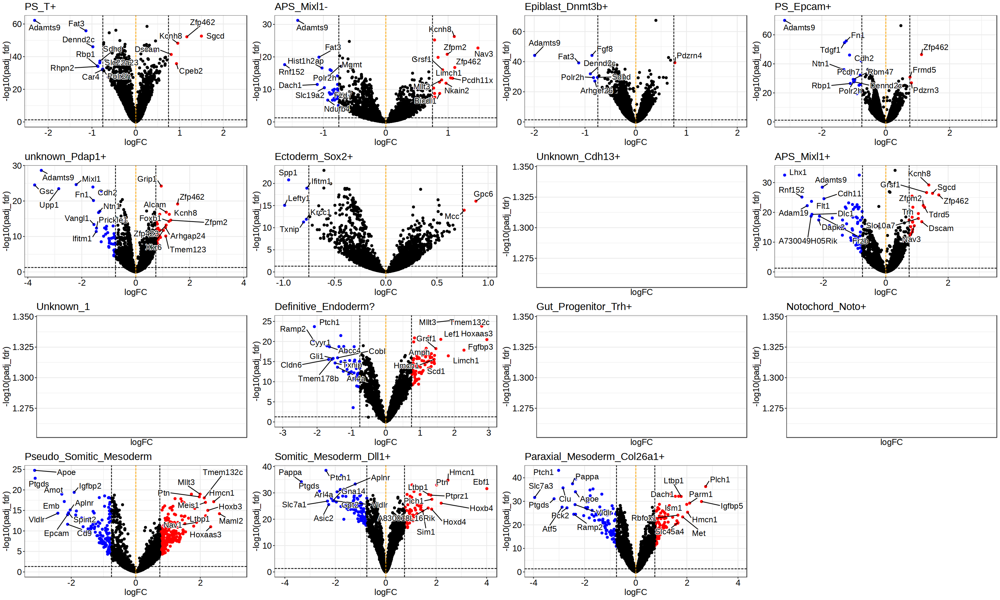

In [247]:
options(repr.plot.width=25, repr.plot.height=15)
ggarrange(plotlist=plots)

In [248]:
levels = lapply(unique(seurat@meta.data$celltypes_v1), function(x){
        t = paste0(x, c('_WT', '_Eomes_KO'))
}) %>% unlist

In [249]:
seurat@meta.data$celltypes_genotype = factor(paste0(seurat@meta.data$celltypes_v1, '_', seurat@meta.data$genotype), levels = levels)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


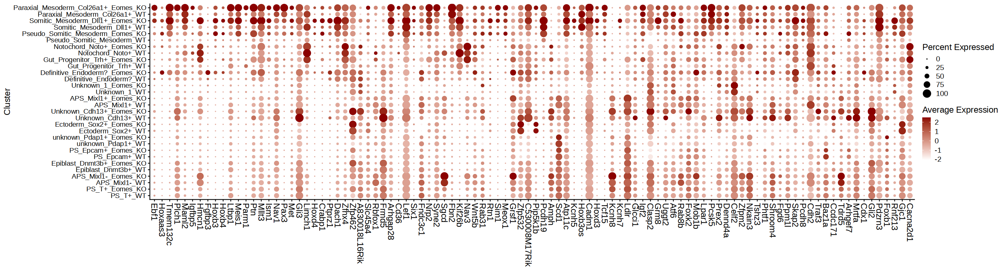

In [250]:
features = unique(DEGs[padj_fdr<0.05] %>% .[order(-logFC), gene]) %>% head(100)

options(repr.plot.width=25, repr.plot.height=7)
DotPlot(seurat, features = unique(features), group.by = 'celltypes_genotype') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=1))

In [256]:
keep

[1] "PS_T+"                      "APS_Mixl1-"                
 [3] "Epiblast_Dnmt3b+"           "PS_Epcam+"                 
 [5] "unknown_Pdap1+"             "Ectoderm_Sox2+"            
 [7] "Unknown_Cdh13+"             "APS_Mixl1+"                
 [9] "Unknown_1"                  "Definitive_Endoderm?"      
[11] "Gut_Progenitor_Trh+"        "Notochord_Noto+"           
[13] "Pseudo_Somitic_Mesoderm"    "Somitic_Mesoderm_Dll1+"    
[15] "Paraxial_Mesoderm_Col26a1+"

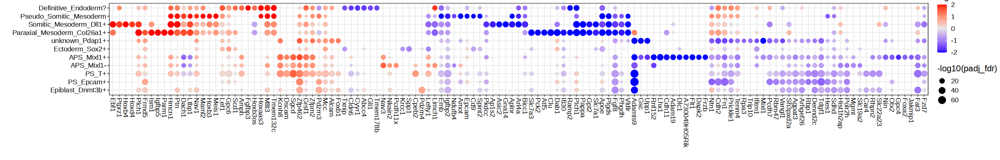

In [261]:
features = unique(DEGs[padj_fdr<0.05 & abs(logFC) > 0.75] %>% .[order(-abs(logFC)), ]) %>% .[,head(.SD, 20), by=celltype] %>% .$gene

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = keep)] %>% 
    .[, logFC := ifelse(logFC>2, 2, ifelse(logFC<=-2, -2, logFC))]

options(repr.plot.width=25, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

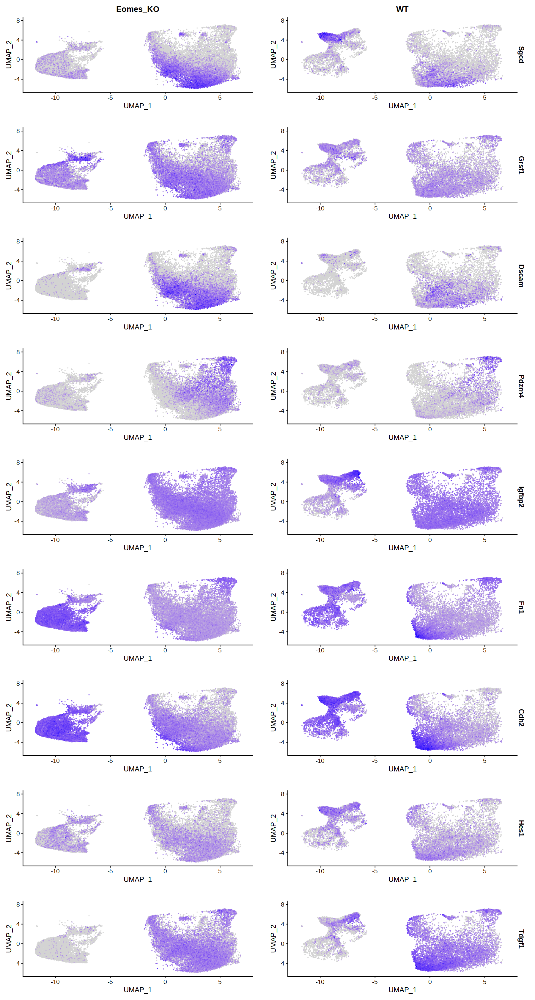

In [310]:
options(repr.plot.width=15, repr.plot.height=28)
FeaturePlot(seurat, features = c('Sgcd', 
                                 'Grsf1', # axial elongation, mid/hindbrain development and axial mesoderm specification through Wnt https://pubmed.ncbi.nlm.nih.gov/15857914/
                                 'Dscam', 'Pdzrn4', 'Igfbp2', 'Fn1', 'Cdh2', 'Hes1', 'Tdgf1'), split.by='genotype', order=TRUE)

In [264]:
keep2 = keep[1:6]
DEGs = DEGs[celltype %in% keep2]

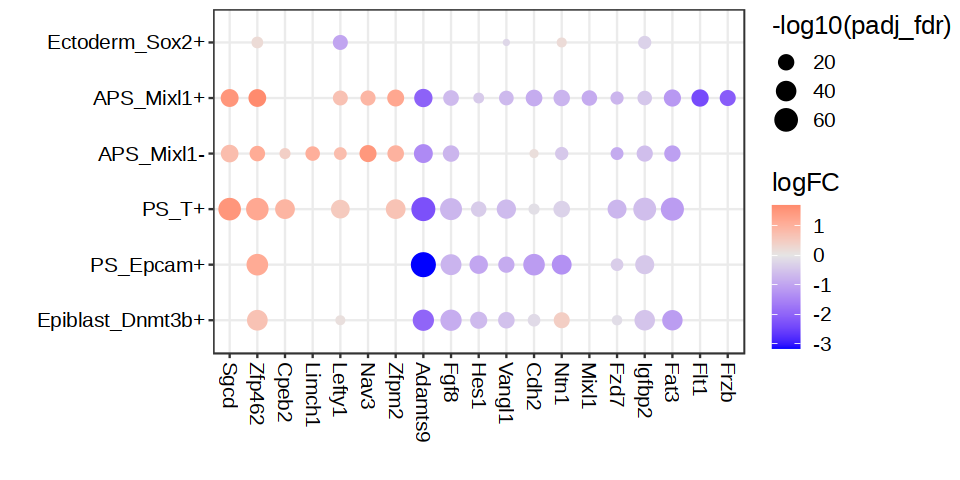

In [268]:
features = c('Sgcd', 'Zfp462', 'Zfpm2', 'Nav3', 'Cpeb2', 'Pdzm4', 'Lefty1', 'Limch1', 'Igfbp2',
            'Fgf8', 'Adamts9', 'Flt1', 'Frzb', 'Ntn1', 'Cdh2', 'Mixl1', 'Fat3', 'Fzd7', 'Hes1', 'Vangl1')

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = keep)]

options(repr.plot.width=8, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

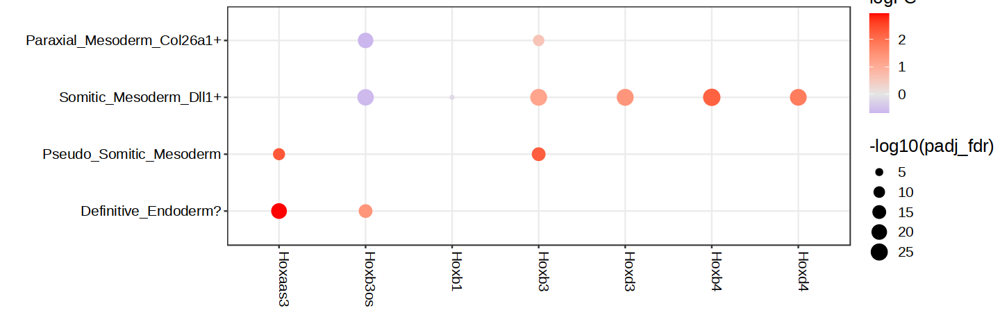

In [252]:
# all Hox genes
features = unique(DEGs$gene)[grep('^Hox', unique(DEGs$gene))]

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = keep)]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

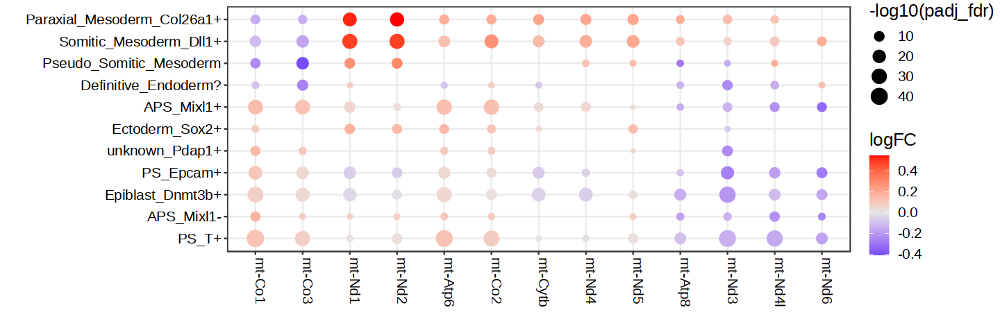

In [253]:
# all Hox genes
features = unique(DEGs$gene)[grep('^mt-', unique(DEGs$gene))]

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = keep)]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot[padj_fdr < 0.05], aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

### EdgeR single-cell

In [272]:
sce = as.SingleCellExperiment(seurat)

In [286]:
# Single cell DEG function

doDiffExpr <- function(sce, groups, min_detection_rate_per_group = 0.35) {
    
  # Sanity checks
  if (!is(sce, "SingleCellExperiment")) stop("'sce' has to be an instance of SingleCellExperiment")
  stopifnot(length(groups)==2)

  # Filter genes by detection rate per group
  cdr_A <- rowMeans(counts(sce[,sce$genotype==opts$groups[1]])>0) >= min_detection_rate_per_group
  cdr_B <- rowMeans(counts(sce[,sce$genotype==opts$groups[2]])>0) >= min_detection_rate_per_group
  out <- .edgeR(sce[cdr_B | cdr_A,]) %>% .[,log_padj_fdr:= -log10(padj_fdr)]
  
  return(out)
}


.edgeR <- function(sce) {
  
  # Convert SCE to DGEList
  sce$genotype <- factor(sce$genotype, levels=opts$groups)
  sce_edger <- scran::convertTo(sce, type="edgeR")
 # sce_edger$samples$norm.factors = sce_edger$samples$sizeFactor
    

  design <- model.matrix(~sce$genotype) # might need to modify to only use this if celltype found in both experiments
  # Estimate dispersions
  sce_edger  <- estimateDisp(sce_edger,design)
  
  # Fit GLM
  fit <- glmQLFit(sce_edger,design)
  
  # Likelihood ratio test
  lrt <- glmQLFTest(fit)
  
  # Construct output data.frame
  out <- topTags(lrt, n=nrow(lrt))$table %>% as.data.table(keep.rownames=T) %>%
    setnames(c("gene","logFC","logCPM","LR","p.value","padj_fdr")) %>%
    .[,c("logCPM","LR"):=NULL]
  
  return(out)
}

In [287]:
# Single_cell
sample_metadata = meta
sce$group = sample_metadata$genotype
opts$groups = c('WT', 'Eomes_KO')
sce$group = factor(sce$group, levels = opts$groups)

de.results = mclapply(keep, function(x){     #unique(meta$celltype.mapped)
    # Only keep cell types with at least 20 cells in both KO and WT
    if(!TRUE %in% as.vector(as.data.frame(table(sample_metadata[celltypes_v1==x, genotype]))$Freq<20) & 
       length(unique(sample_metadata[celltypes_v1==x, genotype]))==2){
        message(x)
        sce_deg = sce[, sample_metadata$celltypes_v1==x]
            out <- doDiffExpr(sce_deg, opts$groups) %>%
              # Add sample statistics
              .[,c("groupA_N","groupB_N"):=list(table(sce_deg$group)[1],table(sce_deg$group)[2])]%>% 
              .[,c("groupA","groupB", "celltype"):=list(opts$groups[1],opts$groups[2],x)]%>%  
              # Calculate statistical significance
              .[, sig := (padj_fdr<=0.05 & abs(logFC)>=1)] %>%
              .[is.na(sig),sig:=FALSE] %>% 
              setorder(-sig, padj_fdr, na.last=T) %>%
              # Add celltype
                .[,celltype:=x]

            # Parse columns
            out[,c("p.value","padj_fdr","logFC","log_padj_fdr"):=list(signif(p.value,digits=3), signif(padj_fdr,digits=3), round(logFC,3),round(log_padj_fdr,3))]
            return(out)
            } 
        }, mc.cores=12) %>% rbindlist()


In [288]:
DEGs = de.results

In [289]:
head(DEGs)

gene,logFC,p.value,padj_fdr,log_padj_fdr,groupA_N,groupB_N,groupA,groupB,celltype,sig
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<chr>,<chr>,<chr>,<lgl>
Adamts9,-1.479,2.76e-211,1.35e-207,206.871,1822,4545,WT,Eomes_KO,Epiblast_Dnmt3b+,TRUE
Gm42418,0.480,2.84e-187,6.93e-184,183.160,1822,4545,WT,Eomes_KO,Epiblast_Dnmt3b+,FALSE
Igfbp2,-0.477,1.74e-103,2.84e-100,99.547,1822,4545,WT,Eomes_KO,Epiblast_Dnmt3b+,FALSE
Rps28,-0.518,6.21e-100,7.58e-97,96.120,1822,4545,WT,Eomes_KO,Epiblast_Dnmt3b+,FALSE
Fat3,-0.996,4.27e-94,4.17e-91,90.380,1822,4545,WT,Eomes_KO,Epiblast_Dnmt3b+,FALSE
Ppia,-0.406,2.39e-88,1.95e-85,84.711,1822,4545,WT,Eomes_KO,Epiblast_Dnmt3b+,FALSE


In [290]:
fwrite(DEGs, sprintf('%s/DEGs_edgeR_sc.txt.gz', args$outdir))

In [291]:
DEGs = fread(sprintf('%s/DEGs_edgeR_sc.txt.gz', args$outdir))

In [292]:
plots = mclapply(keep, function(x){
    tmp = DEGs[celltype==x][!is.na(logFC)]
    p = volcano_plot(tmp, ntop=10, title=x, logFC_thr=0.5)
    return(p)
})

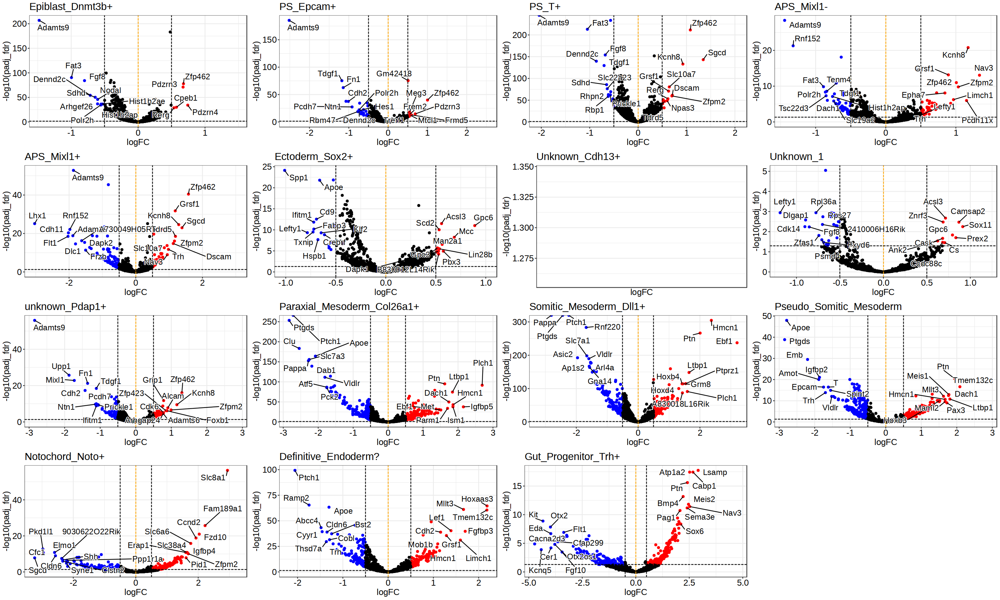

In [293]:
options(repr.plot.width=25, repr.plot.height=15)
ggarrange(plotlist=plots)

In [294]:
levels = lapply(unique(seurat@meta.data$celltypes_v1), function(x){
        t = paste0(x, c('_WT', '_Eomes_KO'))
}) %>% unlist

In [295]:
seurat@meta.data$celltypes_genotype = factor(paste0(seurat@meta.data$celltypes_v1, '_', seurat@meta.data$genotype), levels = levels)

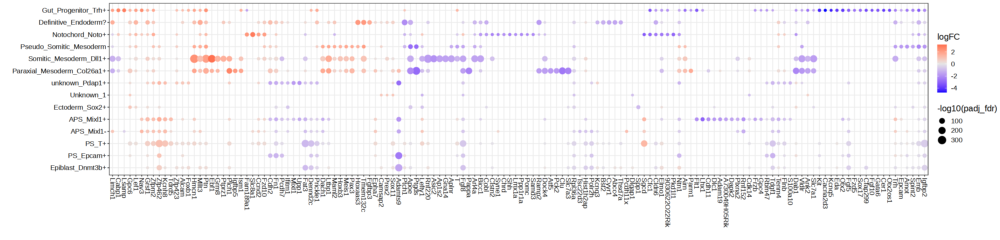

In [299]:
features = unique(DEGs[padj_fdr<0.05 & abs(logFC) > 0.75] %>% .[order(-abs(logFC)), ]) %>% .[,head(.SD, 20), by=celltype] %>% .$gene

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = keep)]

options(repr.plot.width=25, repr.plot.height=6)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

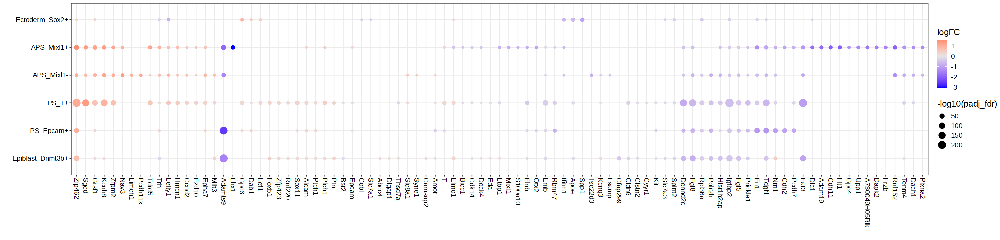

In [300]:
features = unique(DEGs[padj_fdr<0.05 & abs(logFC) > 0.75] %>% .[order(-abs(logFC)), ]) %>% .[,head(.SD, 20), by=celltype] %>% .$gene
keep2 = keep[1:6]
DEGs = DEGs[celltype %in% keep2]

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = keep)]

options(repr.plot.width=25, repr.plot.height=6)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))